# MATH483 HW4 - Tommy Pett 

## Question 1 
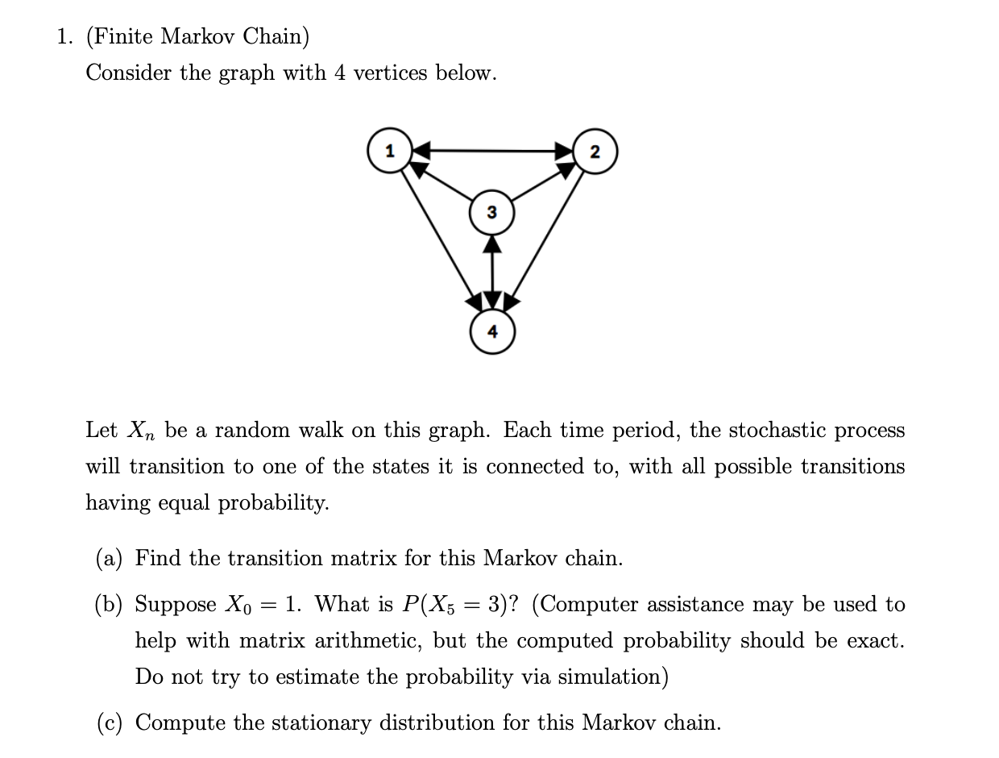

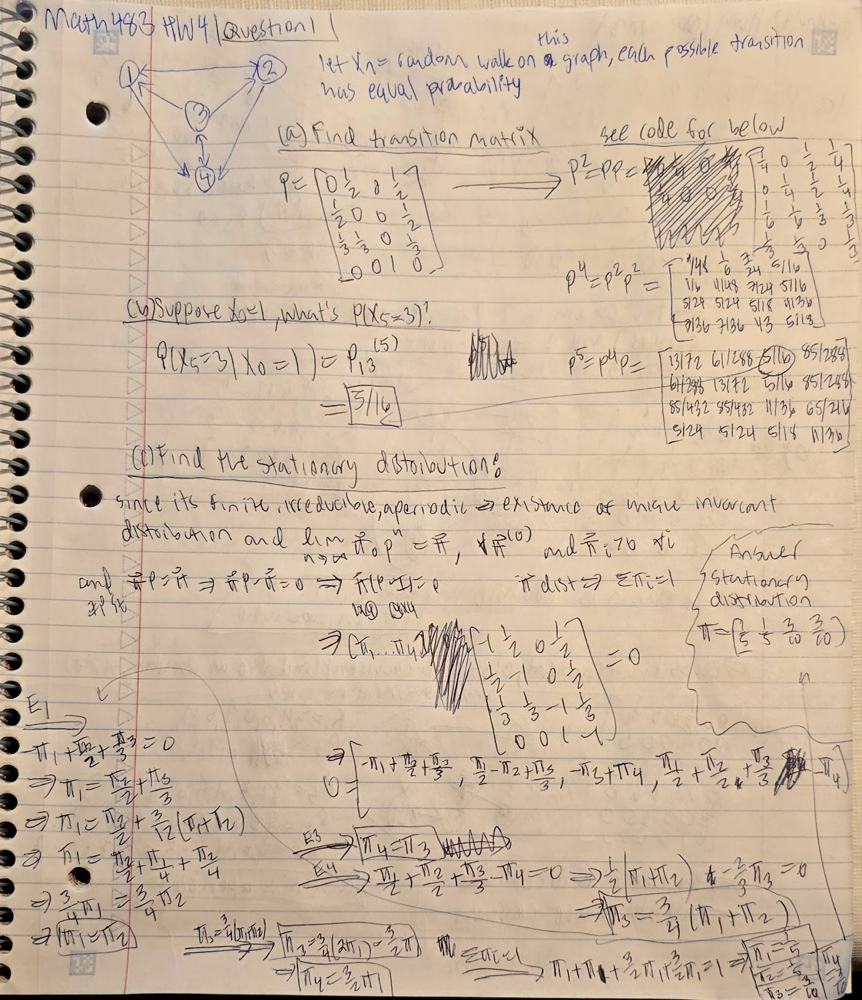

In [23]:
import sympy as sp
P = sp.Matrix([
    [0,            sp.Rational(1,2), 0,            sp.Rational(1,2)],
    [sp.Rational(1,2), 0,            0,            sp.Rational(1,2)],
    [sp.Rational(1,3), sp.Rational(1,3), 0,        sp.Rational(1,3)],
    [0,            0,            1,            0           ]
])

In [24]:
P2 = P*P
P2

Matrix([
[1/4,   0, 1/2, 1/4],
[  0, 1/4, 1/2, 1/4],
[1/6, 1/6, 1/3, 1/3],
[1/3, 1/3,   0, 1/3]])

In [25]:
P4 = P2 * P2
P4

Matrix([
[11/48,   1/6, 7/24,  5/16],
[  1/6, 11/48, 7/24,  5/16],
[ 5/24,  5/24, 5/18, 11/36],
[ 7/36,  7/36,  1/3,  5/18]])

In [26]:
P4*P

Matrix([
[ 13/72, 61/288,  5/16, 85/288],
[61/288,  13/72,  5/16, 85/288],
[85/432, 85/432, 11/36, 65/216],
[  5/24,   5/24,  5/18,  11/36]])

## Question 2 
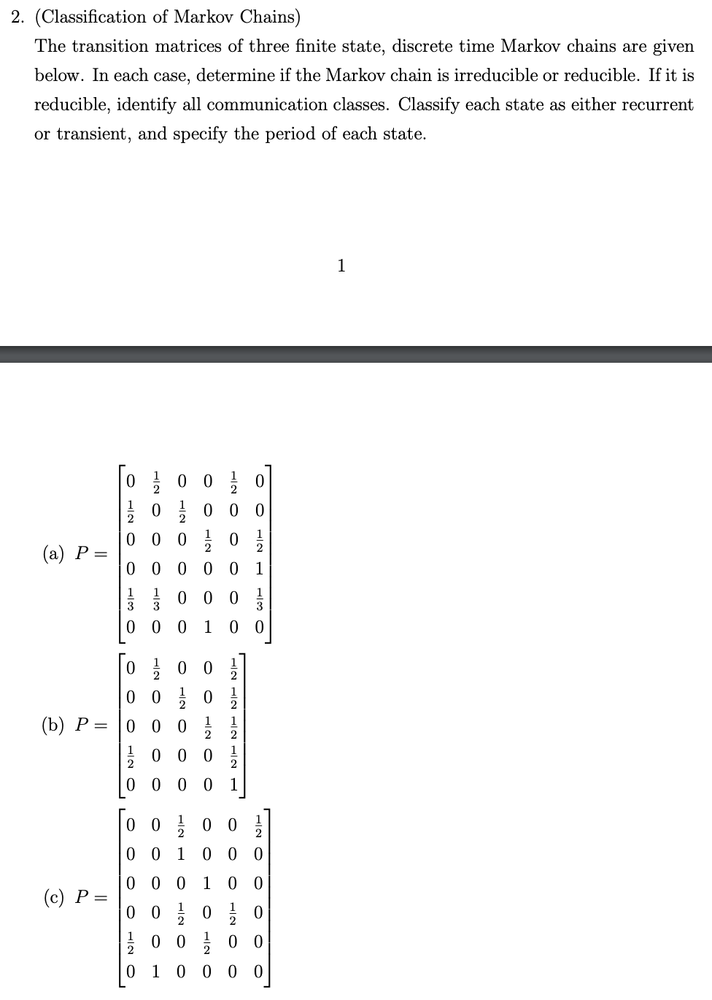

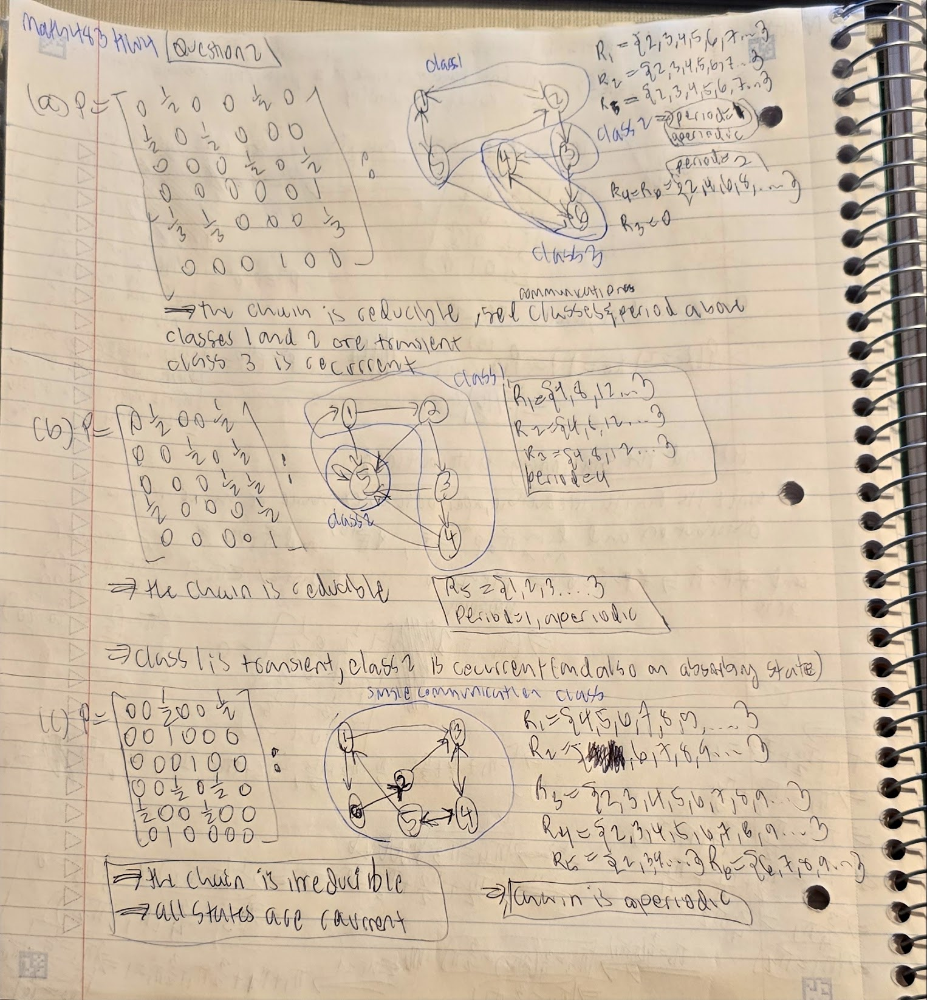

## Question 3 
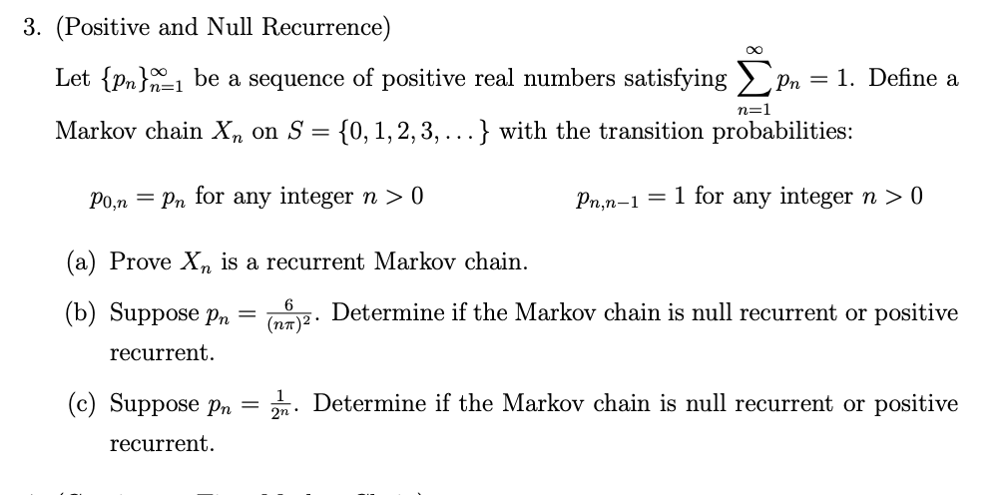

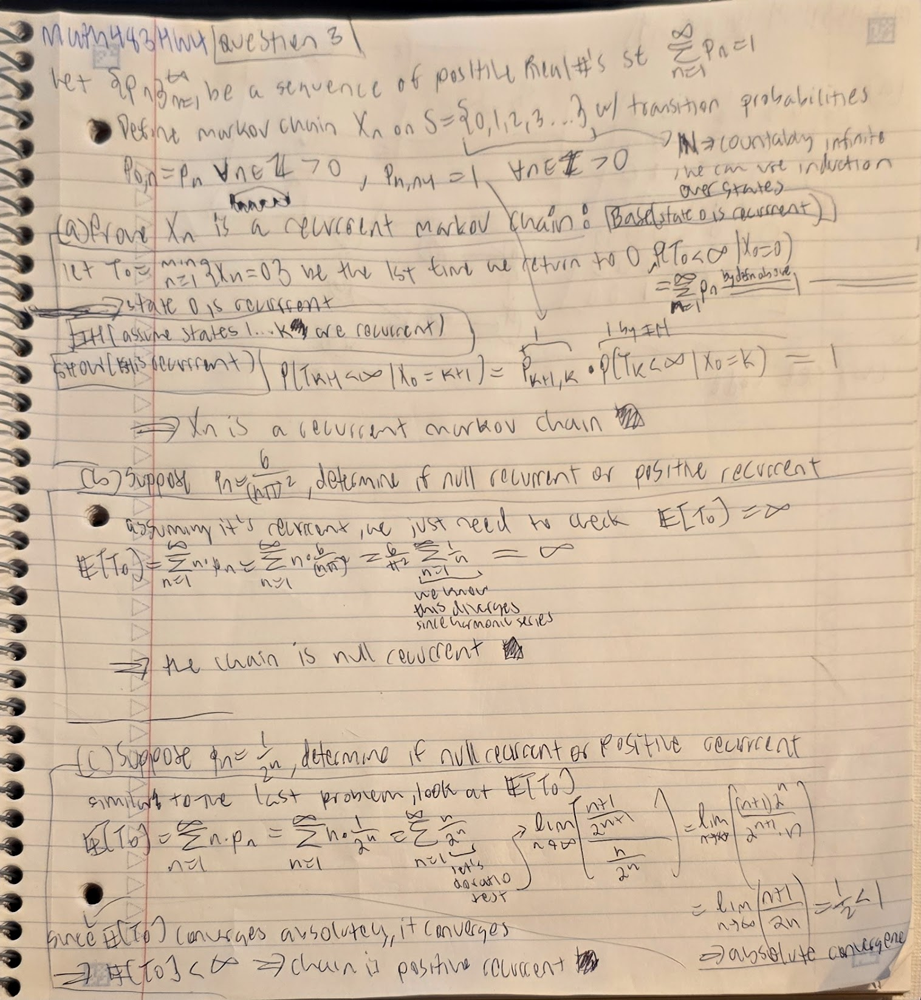

## Question 4
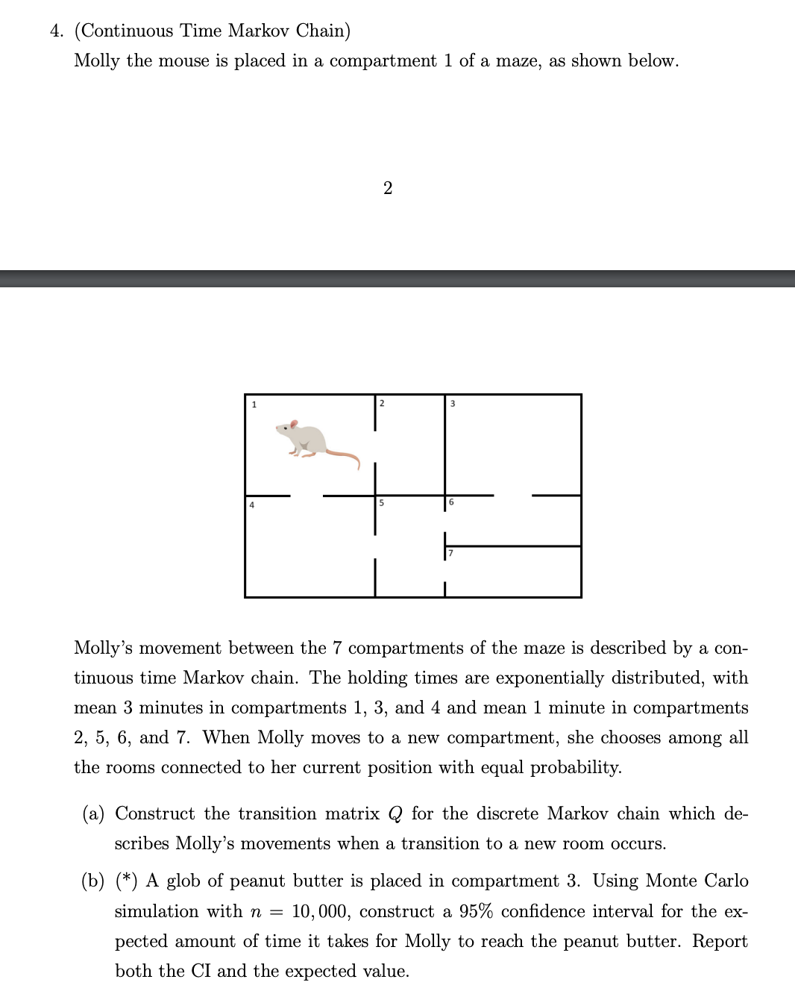

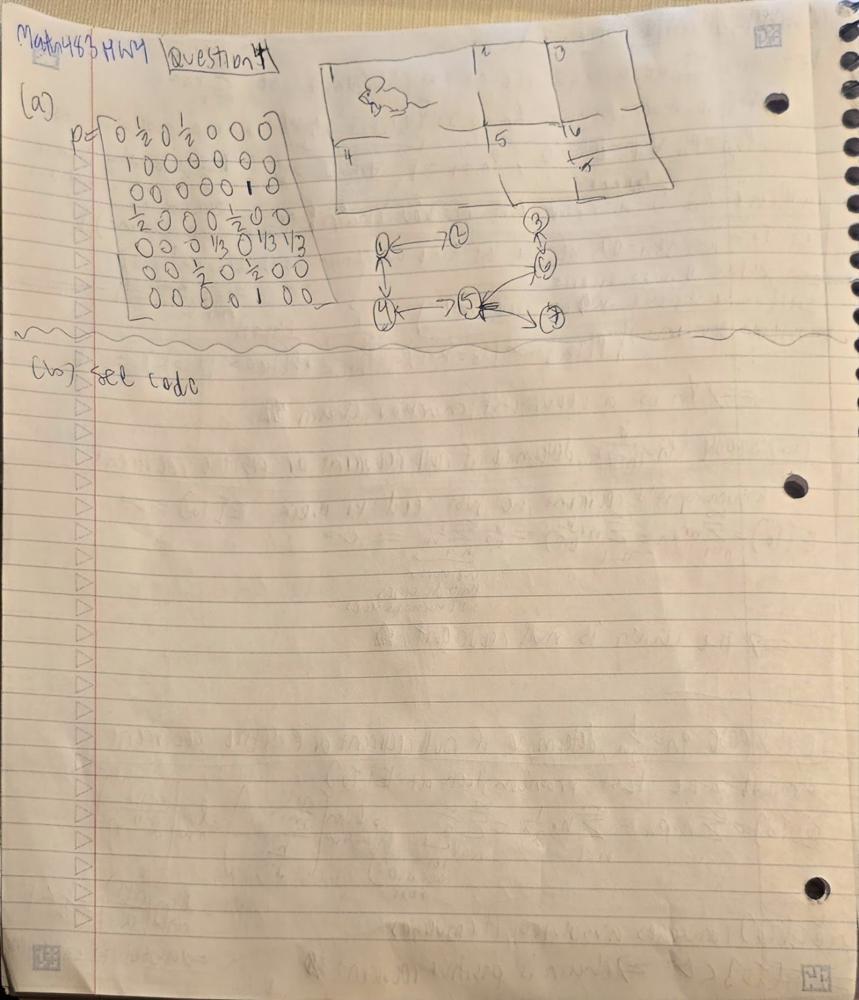

In [47]:
# part b 
import numpy as np
from scipy import stats 
P = np.array([
    [0,   1/2, 0,   1/2, 0,   0,   0  ],  
    [1,   0,   0,   0,   0,   0,   0  ],  
    [0,   0,   0,   0,   0,   1,   0  ],  
    [1/2, 0,   0,   0,   1/2, 0,   0  ],  
    [0,   0,   0,   1/3, 0,   1/3, 1/3],  
    [0,   0,   1/2, 0,   1/2, 0,   0  ],  
    [0,   0,   0,   0,   1,   0,   0  ]   
])

# gonna do 0-based indexing so state 1 = 0, etc...
holding_means = np.array([3, 1, 3, 3, 1, 1, 1])
n = 10000
start = 0         
target = 2        

times = np.empty(n)
for i in range(n):
    current = start
    total_time = 0.0
    while current != target:
        total_time += np.random.exponential(scale=holding_means[current]) # holding ~ Exp(mean = holding_means[current]), since it has memoryless prop 
        current = np.random.choice(7, p=P[current])
    times[i] = total_time


expected = times.mean()
Z = stats.norm.ppf(1-.025) # alpha/2=.025 
MOE = Z*(np.sqrt(np.var(times, ddof=1)) / np.sqrt(n))

print(f"E[time] = {expected} minutes")
print(f"95% CI = ({expected-MOE}, {expected+MOE}) minutes")

E[time] = 56.024444839593485 minutes
95% CI = (55.07180138994767, 56.9770882892393) minutes
